In [187]:
from __future__ import absolute_import, division, print_function # Python2 compatibility
import numpy as np
import matplotlib.pyplot as plt

try:
    %matplotlib inline
    %config InlineBackend.figure_format='retina'
except:
    pass

from The_Payne import utils
from The_Payne import spectral_model
from The_Payne import fitting

wavelength = utils.load_wavelength_array(survey='galah')
mask = utils.load_galah_mask()

ccd = dict()
for each_ccd in range(4):
    ccd[each_ccd] = (wavelength > 1000*(4+each_ccd)) & (wavelength < 1000*(5+each_ccd))

# read in the default neural networks
# NN_coeffs = utils.read_in_neural_network()
# w_array_0, w_array_1, w_array_2, b_array_0, b_array_1, b_array_2, x_min, x_max = NN_coeffs

# if you trained your own neural networks (see last part of this tutorial),
# you can load in your own neural networks
tmp = np.load("NN_normalized_spectra.npz")
w_array_0 = tmp["w_array_0"]
w_array_1 = tmp["w_array_1"]
w_array_2 = tmp["w_array_2"]
b_array_0 = tmp["b_array_0"]
b_array_1 = tmp["b_array_1"]
b_array_2 = tmp["b_array_2"]
x_min = tmp["x_min"]
x_max = tmp["x_max"]
tmp.close()
NN_coeffs = (w_array_0, w_array_1, w_array_2, b_array_0, b_array_1, b_array_2, x_min, x_max)

Here we load 1161 actually observed spectra from GALAH (selected to have high SNR and without flags)

In [129]:
observed_spectra = np.load('galah_selection_191030.npz')
all_sobject_id = observed_spectra['sobject_id']
all_labels = observed_spectra['labels']
all_flux = observed_spectra['flux']
all_flux_error = observed_spectra['flux_error']
observed_spectra.close()

For those we want to fit the labels and store them similarly to all_labels in the array 'payne_labels'

In [190]:
payne_labels = np.ones(np.shape(all_labels))

for each_index in range(len(all_sobject_id)):
    # fit the labels
    popt, pcov, best_fit_spec = fitting.fit_normalized_spectrum_single_star_model(norm_spec = all_flux[each_index], 
        spec_err = all_flux_error[each_index], NN_coeffs = NN_coeffs, wavelength=wavelength, mask=mask, p0 = None)

    # just a simple progress print
    if each_index%50==0:
        print(each_index)
    
    # store optimised parameters in 'payne_labels'
    payne_labels[:,each_index] = popt[:-1]

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150


For some spectra, we might not only want to fit, but also plot the modelled and observed spectra with 'fit_and_plot'

In [226]:
def fit_and_plot(sobject_id):
    each_index = np.where(all_sobject_id == sobject_id)[0]
    if len(each_index) != 1:
        raise RuntimeError('Could not find sobject_id')
    else:
        each_index = each_index[0]
    labels = all_labels[:,each_index]
    spec = all_flux[each_index]
    spec_err = all_flux_error[each_index]
    
    popt, pcov, best_fit_spec = fitting.fit_normalized_spectrum_single_star_model(norm_spec = spec, 
        spec_err = spec_err, NN_coeffs = NN_coeffs, wavelength=wavelength, mask=mask, p0 = None)

    print('GALAH DR3:')
    print(labels)
    print('The Payne')
    print(popt[:-1])
    
    f, gs = plt.subplots(8,1,figsize=(15,20))
    for it in range(4):
        ax = gs[2*it]
        ax2 = gs[2*it+1]
        ax.plot(wavelength[ccd[it]],spec[ccd[it]], 'k', lw=0.5, label = 'GALAH spectrum')
        #ax.fill_between(wavelength[ccd[it]],spec[ccd[it]]-spec_err[ccd[it]],spec[ccd[it]]+spec_err[ccd[it]], facecolor='grey', label = 'flux error')
        ax.plot(wavelength[ccd[it]],best_fit_spec[ccd[it]], 'r', lw=0.5, label = 'Best-fit model')
        ax.set_ylim(0., 1.05)

        ax2.plot(wavelength[ccd[it]],spec[ccd[it]]-best_fit_spec[ccd[it]], 'r', lw=0.5, label = 'Obs - Model')
        ax2.set_ylim(-0.1, 0.1)

For some solar twins, just plot the observed and modelled spectra (odd panels) as well as the residuals (even panels) for the 4 CCDs

In [219]:
solar_twins = np.where(
    (np.abs(all_labels[0] - 5777) < 100) &
    (np.abs(all_labels[1] - 4.43) < 0.1) &
    (np.abs(all_labels[2] - 0.00) < 0.1) &
    (np.abs(all_labels[3] - 0.00) < 0.1)
    )[0]

[ 5.68741797e+03  4.43564177e+00 -7.38224983e-02  2.67398236e-03]
[ 5.65286005e+03  4.04586872e+00 -2.34366720e-01 -8.08928225e-02]
[ 5.75174902e+03  4.33791685e+00 -9.99784470e-02  2.84198694e-02]
[ 5.69374773e+03  4.00295117e+00 -2.93640434e-01 -3.39553760e-02]


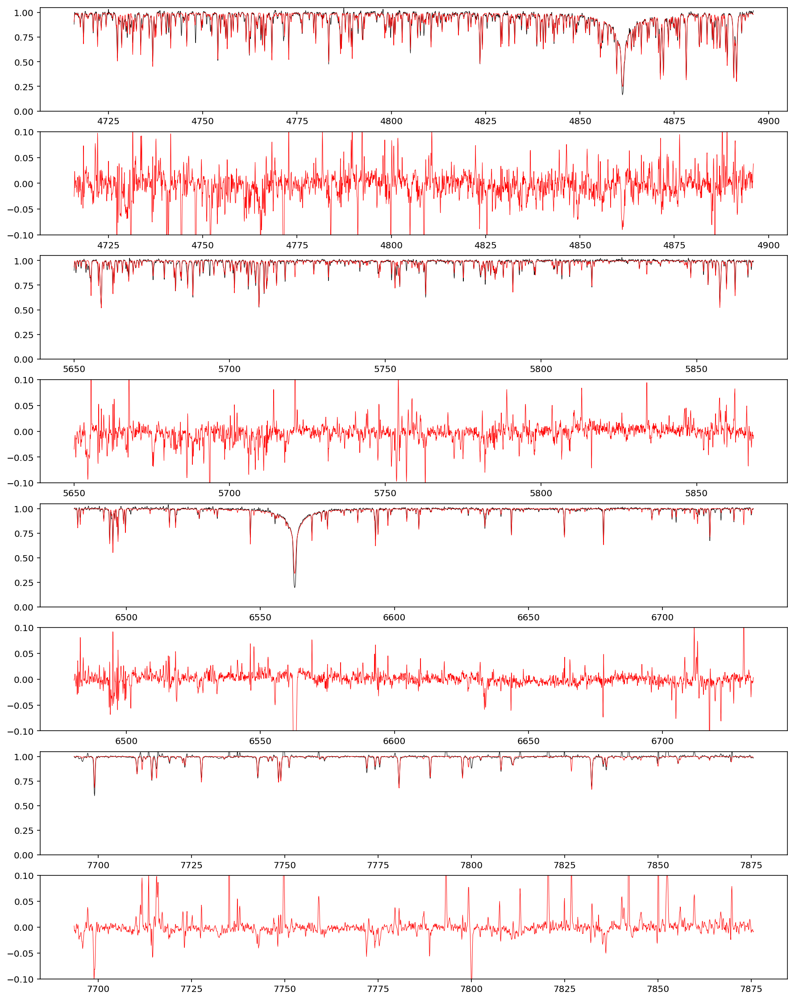

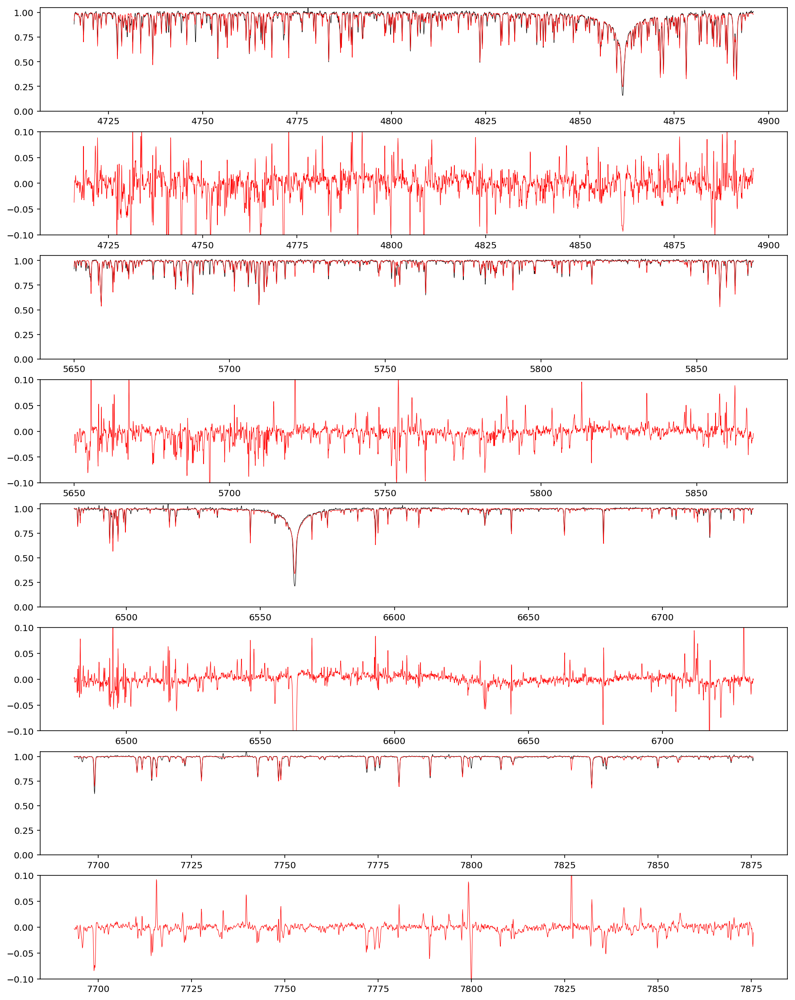

In [220]:
for each_index in solar_twins[:2]:
    fit_and_plot(all_sobject_id[each_index])

Let's check the stars with bad logg estimates

In [229]:
bad_logg = np.where(
    (np.abs(all_labels[1] - payne_labels[1]) > 1.5)
    )[0]
print(bad_logg)

[214 216 272 332 387 513 514 531 609 611 636 711]


GALAH DR3:
[ 4.64594385e+03  2.25962925e+00 -1.03068018e+00  4.67556791e-01]
The Payne
[ 4.78220991e+03  4.01250591e+00 -3.70825664e-01  2.52025619e-01]
GALAH DR3:
[ 4.54264453e+03  1.55334175e+00 -1.55346012e+00  4.71068412e-01]
The Payne
[ 4.27501545e+03  3.87070010e+00 -9.09786534e-01  3.26114463e-01]
GALAH DR3:
[5.03508887e+03 4.46809244e+00 5.72198868e-01 5.86577752e-02]
The Payne
[ 4.68540076e+03  2.90021512e+00 -2.99071306e-03 -5.24932471e-02]
GALAH DR3:
[4.79062500e+03 2.57051563e+00 1.60473824e-01 2.16393616e-01]
The Payne
[ 4.72715169e+03  4.21819094e+00 -2.40808622e-01 -3.75762747e-03]
GALAH DR3:
[4.61186475e+03 2.37044406e+00 4.41370010e-02 3.10898290e-02]
The Payne
[4.85866990e+03 3.97764079e+00 2.11021586e-01 9.49741327e-03]
GALAH DR3:
[ 4.73236816e+03  2.41947031e+00 -9.74254608e-02 -2.67381081e-02]
The Payne
[5.08790432e+03 4.04385239e+00 1.18637110e-01 8.54418345e-03]
GALAH DR3:
[ 4.74473145e+03  2.42600775e+00 -1.26938343e-01 -6.47848456e-03]
The Payne
[5.10566805e+03

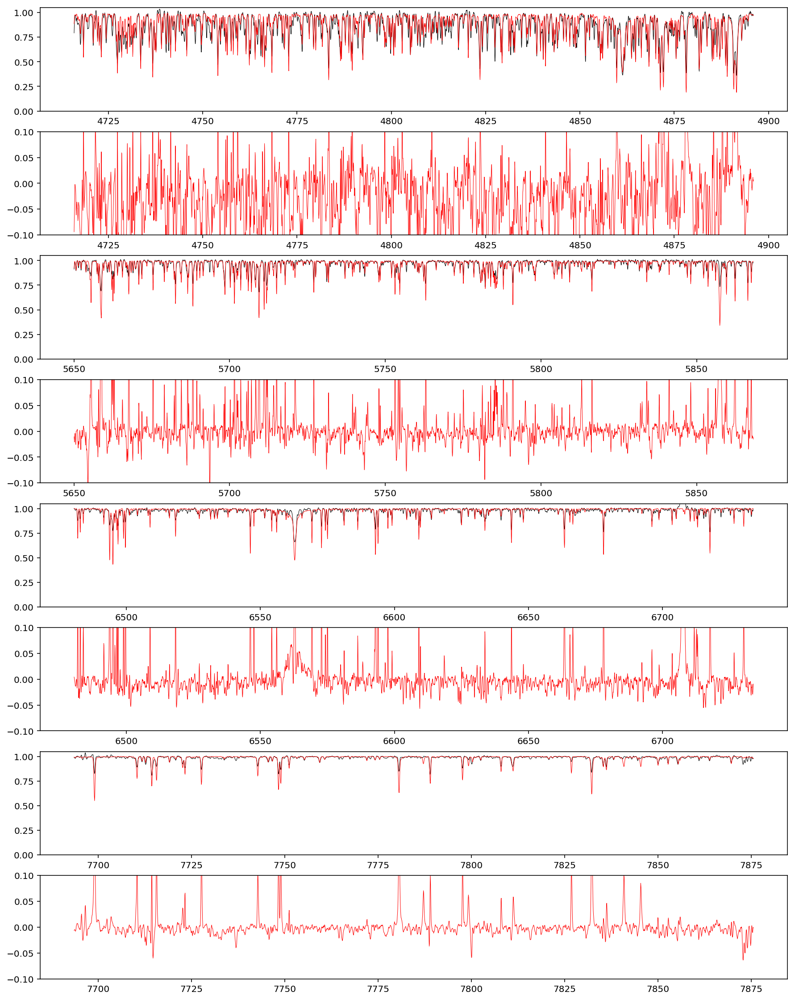

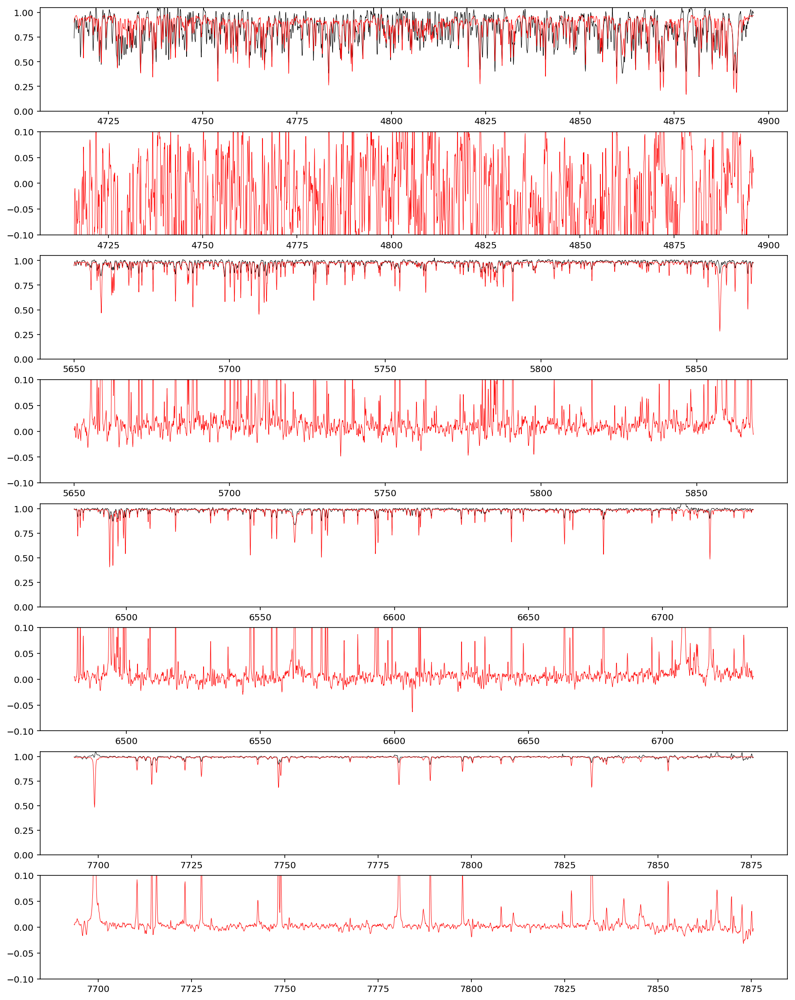

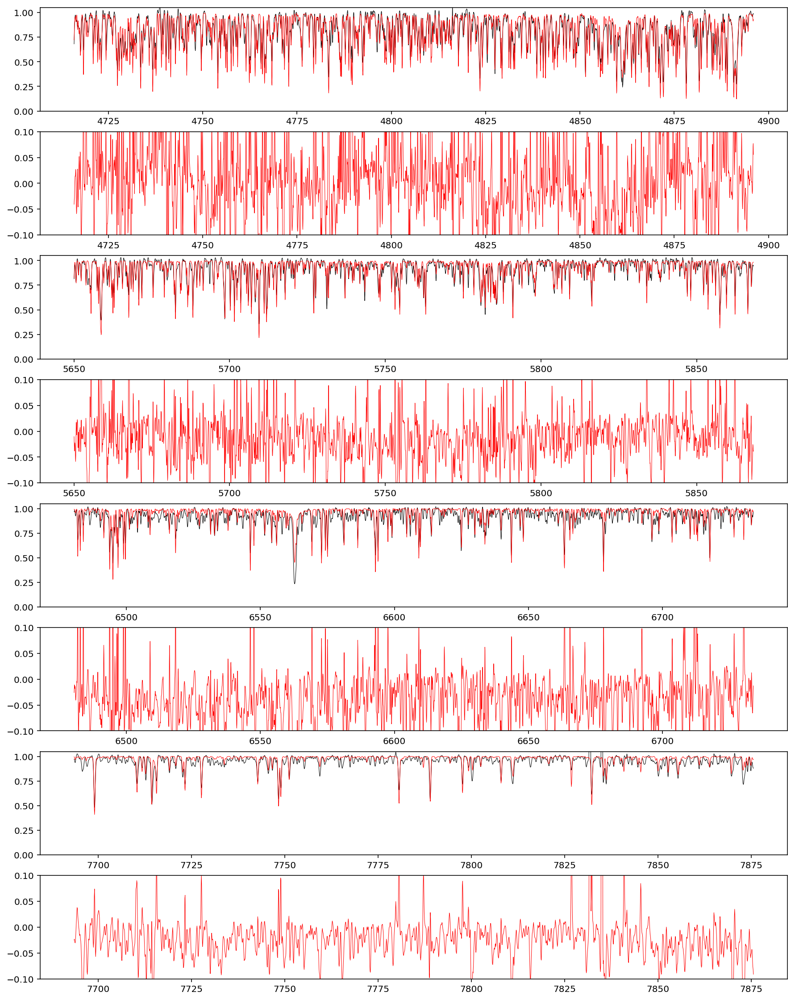

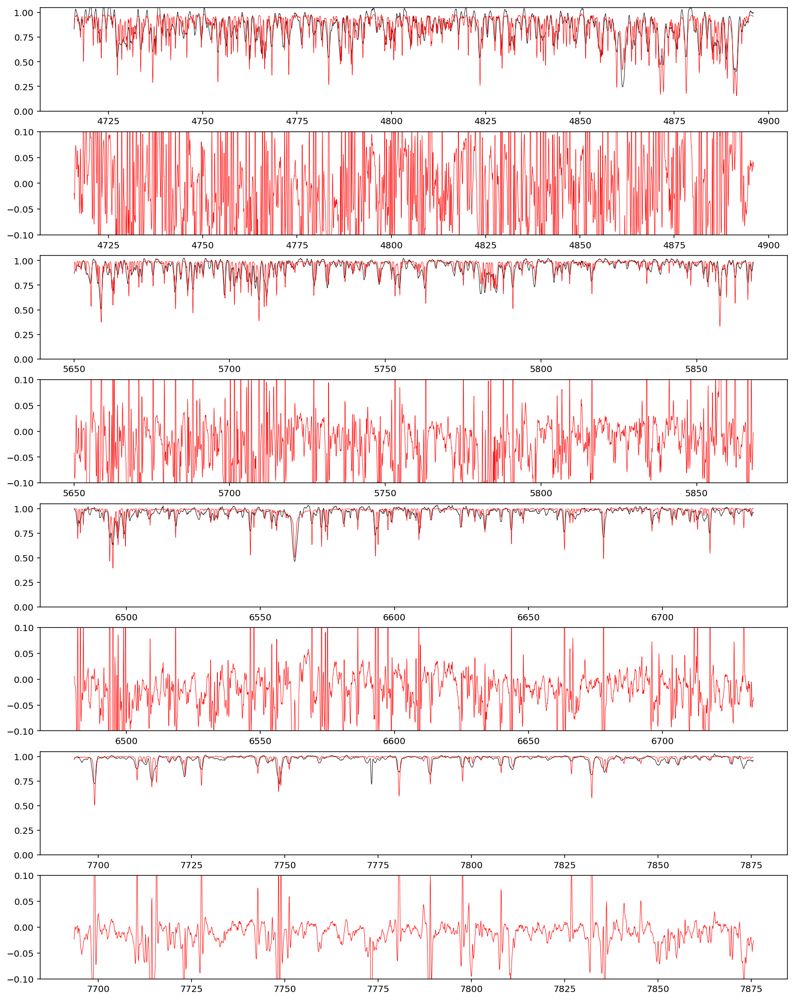

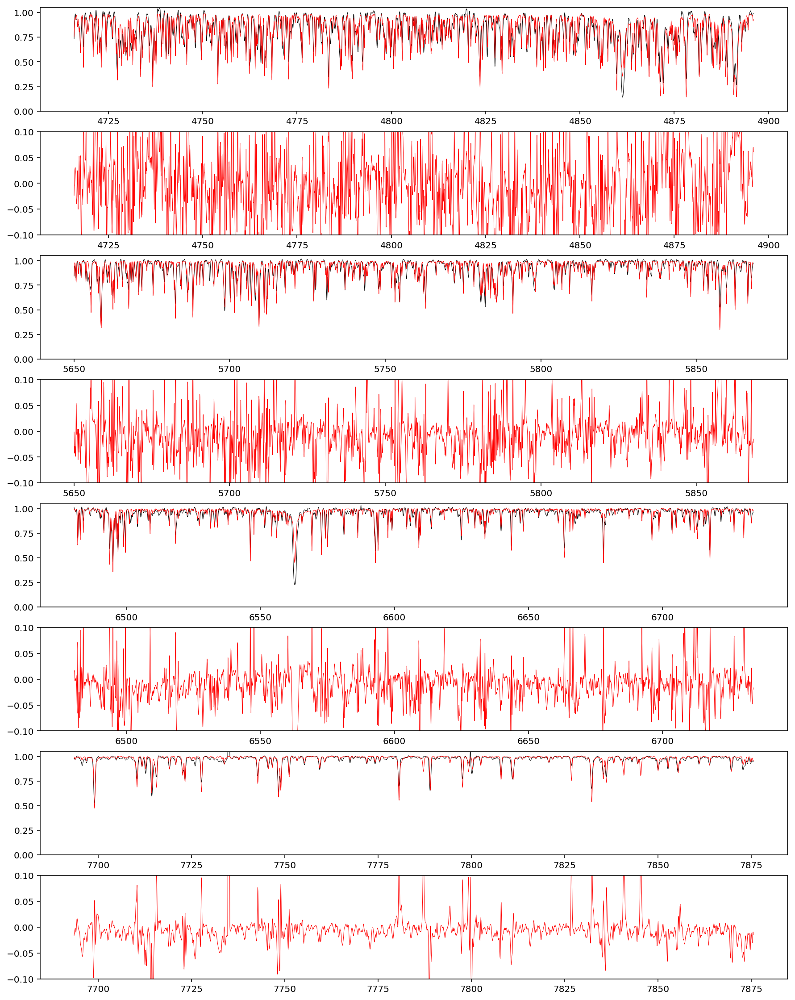

...

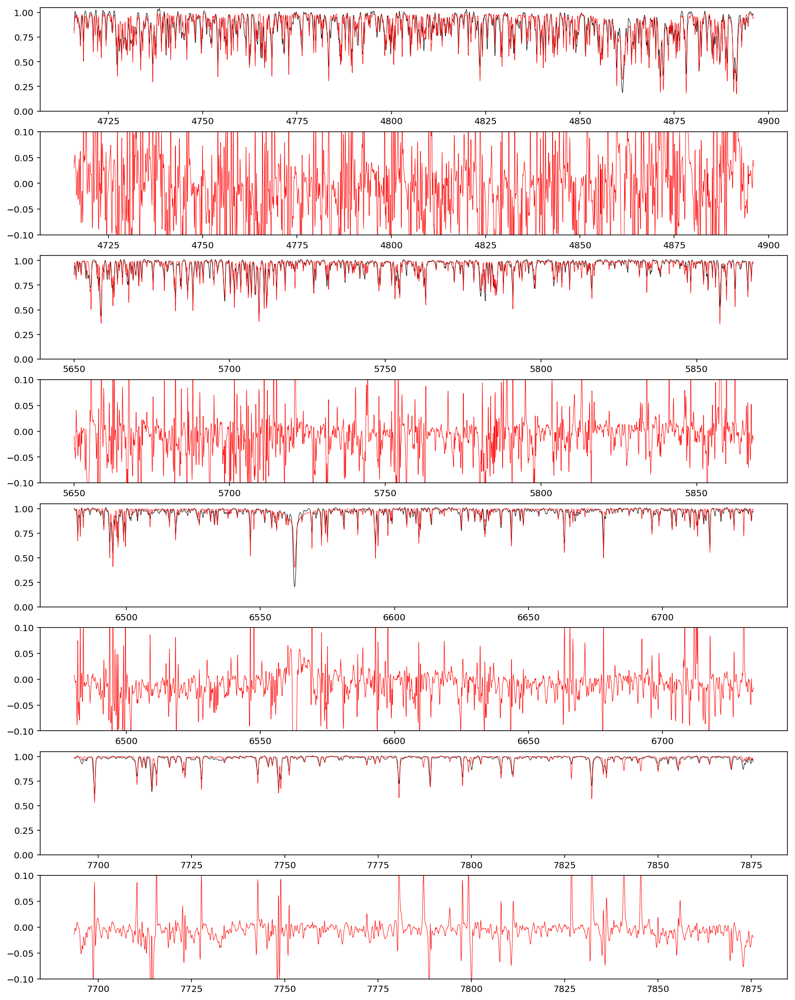

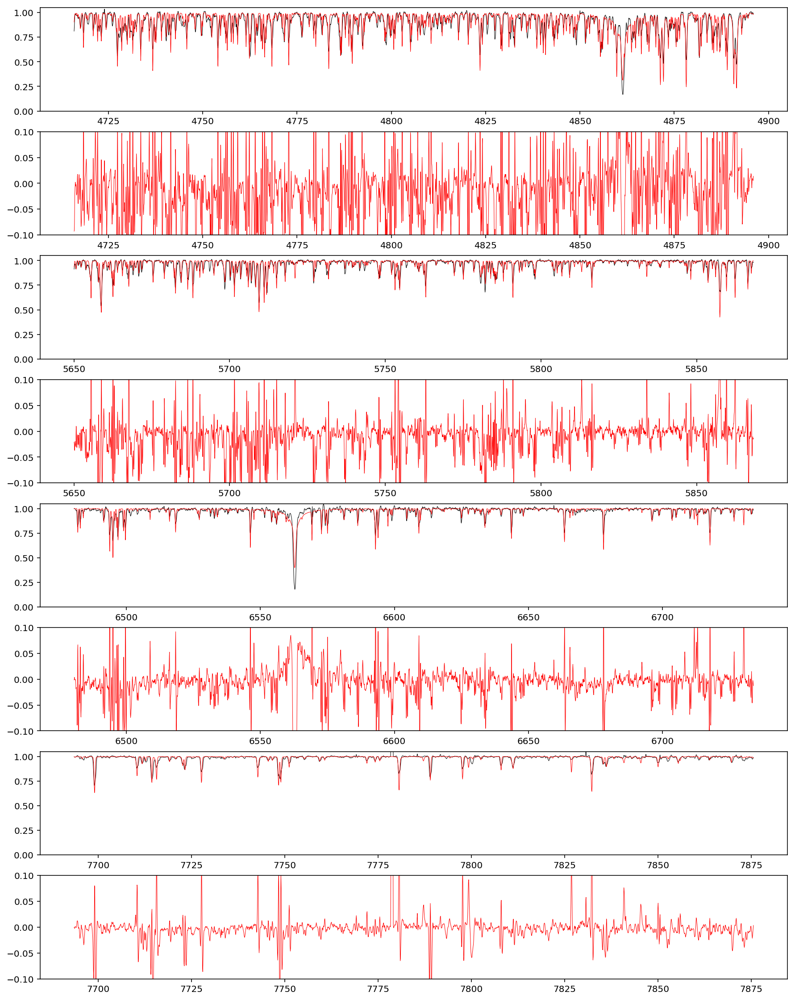

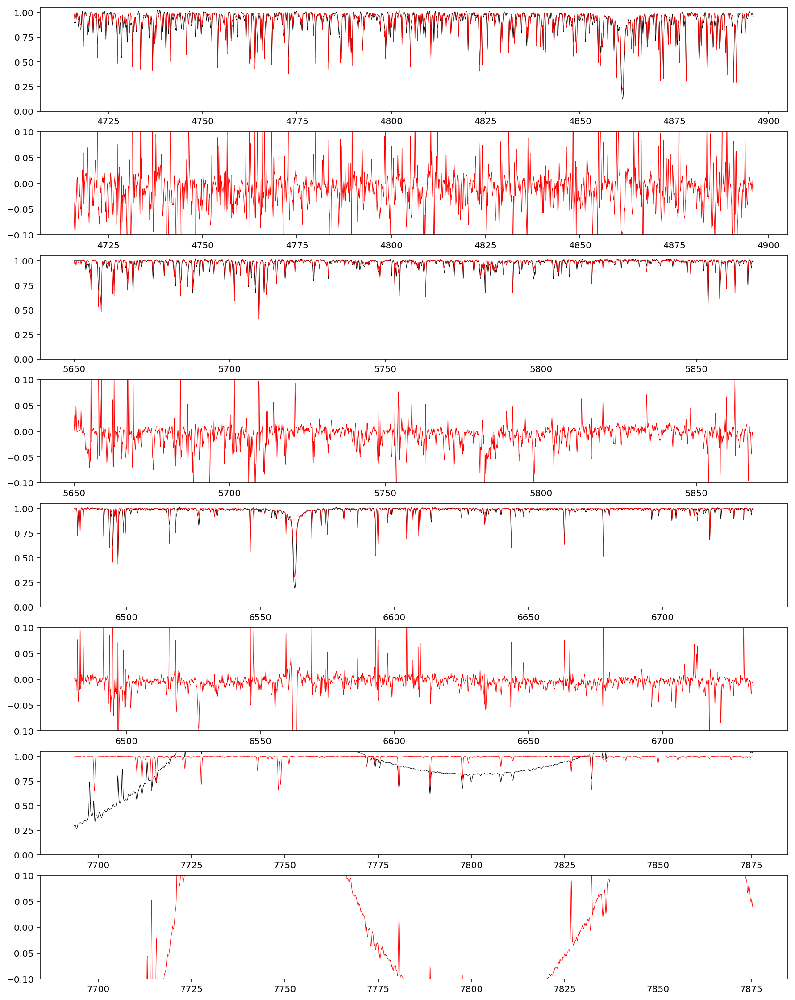

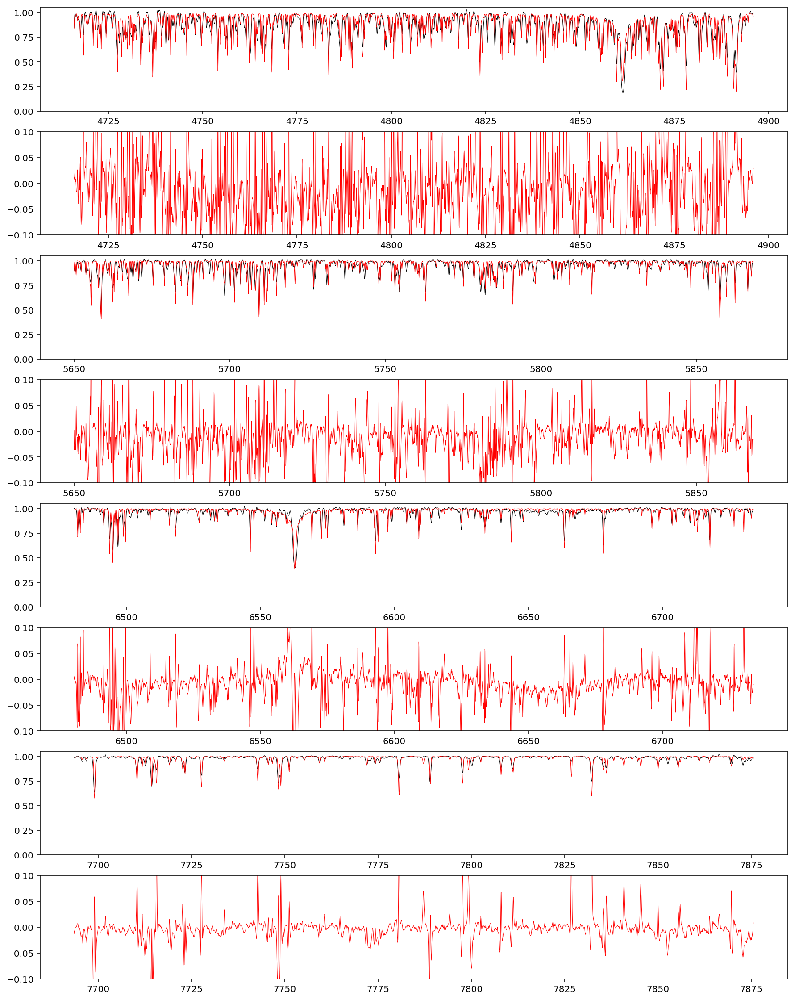

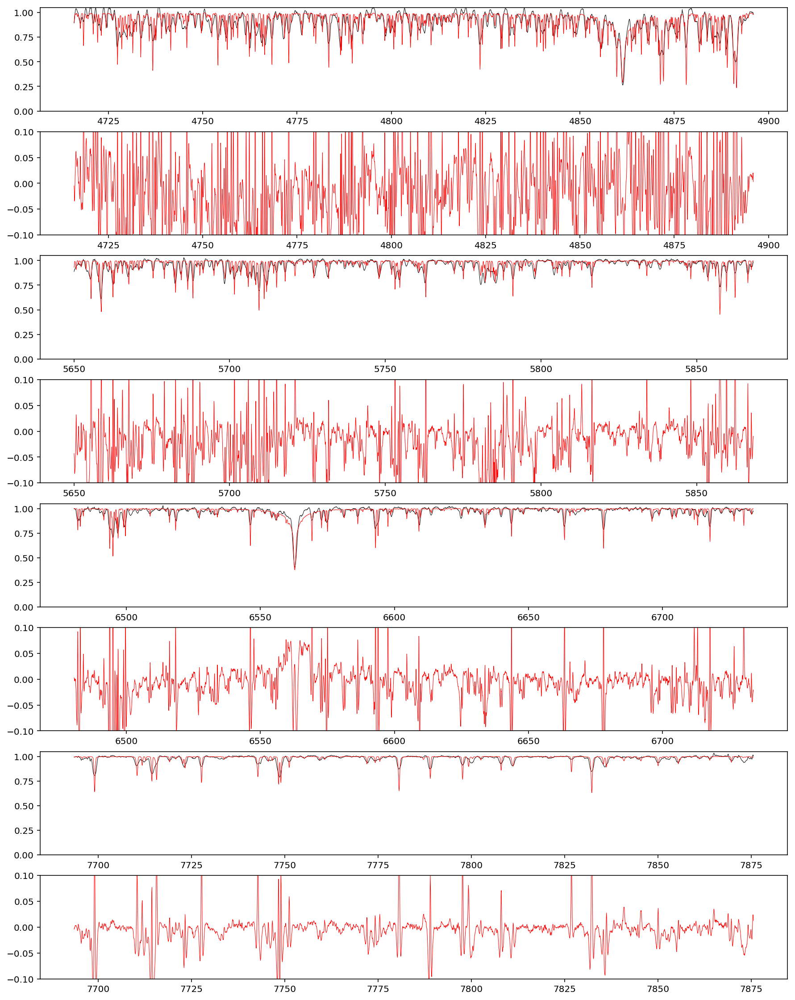

In [230]:
for each_index in bad_logg:
    fit_and_plot(all_sobject_id[each_index])

Just plot the spectroscopic HRD (Kiel diagram) and the [Fe/H] vs. [alpha/Fe] plots

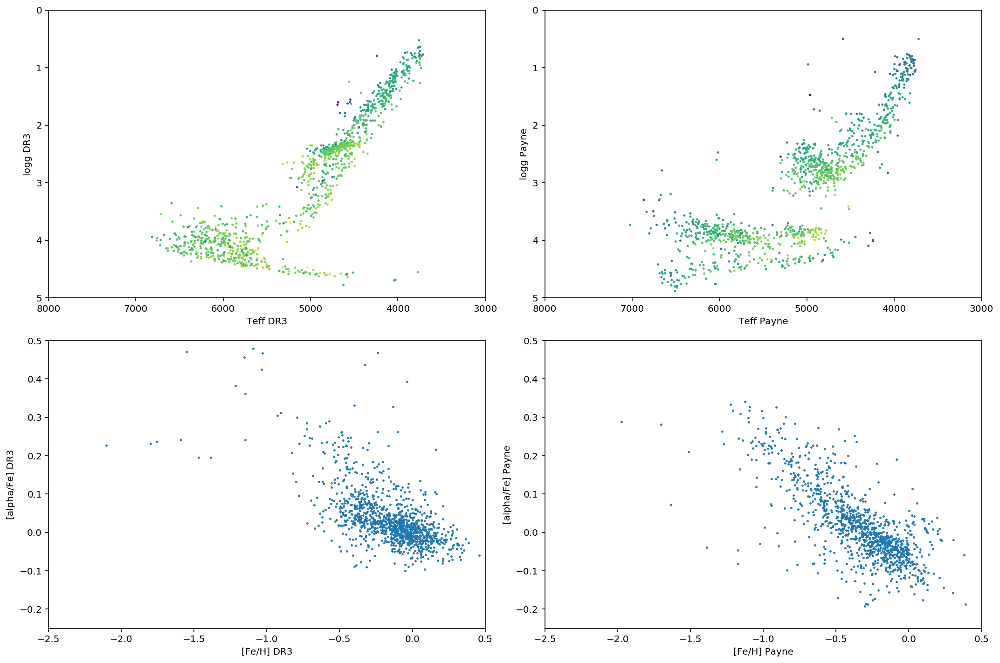

In [194]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

kwargs = dict(s=2)

ax1.scatter(all_labels[0],all_labels[1],c=all_labels[2],vmin=-2,vmax=0.5,**kwargs)
ax2.scatter(payne_labels[0],payne_labels[1],c=payne_labels[2],vmin=-2,vmax=0.5,**kwargs)
ax3.scatter(all_labels[2],all_labels[3],**kwargs)
ax4.scatter(payne_labels[2],payne_labels[3],**kwargs)

ax1.set_xlim(8000,3000)
ax1.set_xlabel('Teff DR3')
ax1.set_ylim(5,0)
ax1.set_ylabel('logg DR3')
ax2.set_xlim(8000,3000)
ax2.set_xlabel('Teff Payne')
ax2.set_ylim(5,0)
ax2.set_ylabel('logg Payne')

ax3.set_xlim(-2.5,0.5)
ax3.set_ylim(-0.25,0.5)
ax4.set_xlim(-2.5,0.5)
ax4.set_ylim(-0.25,0.5)

ax3.set_xlabel('[Fe/H] DR3')
ax3.set_ylabel('[alpha/Fe] DR3')
ax4.set_xlabel('[Fe/H] Payne')
ax4.set_ylabel('[alpha/Fe] Payne')

plt.tight_layout()

Plot the difference of the Payne-DR3 labels

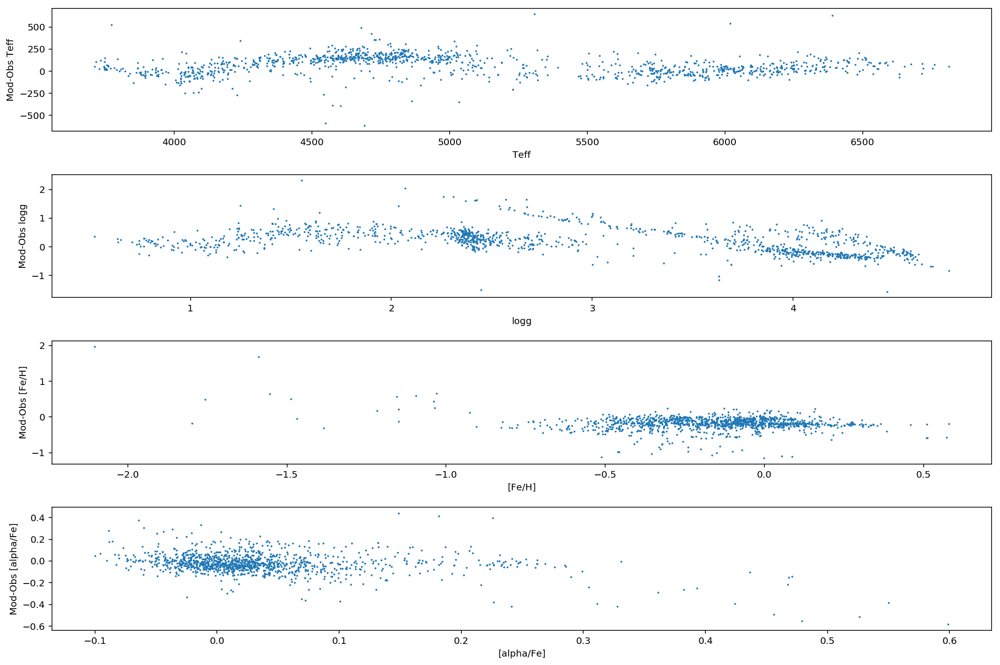

In [196]:
f, gs = plt.subplots(4,1,figsize=(15,10))
label_names = ['Teff','logg','[Fe/H]','[alpha/Fe]']
for each_index in range(4):
    ax=gs[each_index]
    ax.scatter(
        all_labels[each_index], payne_labels[each_index]-all_labels[each_index],s=1
        )
    ax.set_xlabel(label_names[each_index])
    ax.set_ylabel('Mod-Obs '+label_names[each_index])
plt.tight_layout()